In [1]:
# Data handling
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Clustering
from sklearn.cluster import KMeans, DBSCAN
from sklearn import preprocessing
from sklearn.metrics import silhouette_score

# Dimensionality reduction
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Visualization
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as p3
from matplotlib import animation

%matplotlib inline 

def load_preprocess_data():
    """ Load and preprocess data
    """
    
    # Load data
    df = pd.read_csv("..Data/data.csv")
    
    # remove empty values
    df = df.loc[df.TotalCharges!=" ", :]
    df.TotalCharges = df.TotalCharges.astype(float)
    
    # Label data correctly
    replace_cols = [ 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
                    'TechSupport','StreamingTV', 'StreamingMovies', 'Partner', 'Dependents',
                   'PhoneService', 'MultipleLines', 'PaperlessBilling', 'Churn']
    for i in replace_cols : 
        df.loc[:, i]  = df.loc[:, i].replace({'No internet service' : 'No', 'No phone service':'No'})
        df.loc[:, i]  = df.loc[:, i].map({'No':0, 'Yes':1})
    df.gender = df.gender.map({"Female":0, "Male":1})
    
    # One-hot encoding of variables
    others_categorical = ['Contract', 'PaymentMethod', 'InternetService']
    for i in others_categorical:
        df = df.join(pd.get_dummies(df[i], prefix=i))
    df.drop(others_categorical, axis=1, inplace=True)
    
    # Calculate number of services
    services = ['PhoneService', 'MultipleLines', 'OnlineSecurity',
            'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
            'StreamingMovies', 'InternetService_DSL', 'InternetService_Fiber optic',
            'InternetService_No']
    df['nr_services'] = df.apply(lambda row: sum([row[x] for x in services[:-1]]), 1)
    
    return df.drop('customerID', 1)

def plot_corr(df):
    corr = df.corr()
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    f, ax = plt.subplots(figsize=(11, 9))
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})
    
def plot_tsne(tnse_data, kmeans_labels):
    df_tsne = pd.DataFrame(tsne_data).rename({0: 'x', 1: 'y'}, axis=1)
    df_tsne['z'] = kmeans_labels
    sns.scatterplot(x=df_tsne.x, y=df_tsne.y, hue=df_tsne.z, palette="Set2")
    plt.show()
    
def prepare_pca(n_components, data, kmeans_labels):
    names = ['x', 'y', 'z']
    matrix = PCA(n_components=n_components).fit_transform(data)
    df_matrix = pd.DataFrame(matrix)
    df_matrix.rename({i:names[i] for i in range(n_components)}, axis=1, inplace=True)
    df_matrix['labels'] = kmeans_labels
    
    return df_matrix

def prepare_tsne(n_components, data, kmeans_labels):
    names = ['x', 'y', 'z']
    matrix = TSNE(n_components=n_components).fit_transform(data)
    df_matrix = pd.DataFrame(matrix)
    df_matrix.rename({i:names[i] for i in range(n_components)}, axis=1, inplace=True)
    df_matrix['labels'] = kmeans_labels
    
    return df_matrix

def plot_3d(df, name='labels'):
    iris = px.data.iris()
    fig = px.scatter_3d(df, x='x', y='y', z='z',
                  color=name, opacity=0.5)
    

    fig.update_traces(marker=dict(size=3))
    fig.show()
    
def plot_animation(df, label_column, name):
    def update(num):
        ax.view_init(200, num)

    N=360
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(tsne_3d_df['x'], tsne_3d_df['y'], tsne_3d_df['z'], c=tsne_3d_df[label_column],
               s=6, depthshade=True, cmap='Paired')
    ax.set_zlim(-15, 25)
    ax.set_xlim(-20, 20)
    plt.tight_layout()
    ani = animation.FuncAnimation(fig, update, N, blit=False, interval=50)
    ani.save('{}.gif'.format(name), writer='imagemagick')
    plt.show()

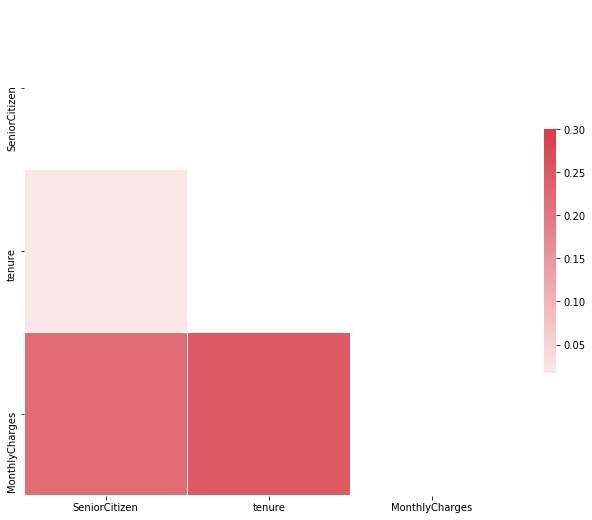

In [18]:
corr = df.corr()
#mask used to hide duplication of Corr in heatmap
mask = np.zeros_like(corr, dtype=np.bool)
mask2 = np.zeros_like(corr)
mask2[np.triu_indices_from(mask)]=True

mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
#sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
sns.heatmap(corr, mask=mask2, cmap=cmap, vmax=.3, center=0,square=True, linewidths=.5, cbar_kws={"shrink": .5})


In [261]:
df = pd.read_csv("../Data/data.csv")
df.head(4)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No


In [259]:
df.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'PaperlessBilling', 'MonthlyCharges', 'TotalCharges',
       'Churn', 'Contract_Month-to-month', 'Contract_One year',
       'Contract_Two year'],
      dtype='object')

In [300]:
    df = pd.read_csv("../Data/data.csv")
    
    # remove empty values
    df = df.loc[df.TotalCharges!=" ", :]
    df.TotalCharges = df.TotalCharges.astype(float)
    
    # Label data correctly
    replace_cols = [ 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
                    'TechSupport','StreamingTV', 'StreamingMovies', 'Partner', 'Dependents',
                   'PhoneService', 'MultipleLines', 'PaperlessBilling', 'Churn']
    for i in replace_cols : 
        df.loc[:, i]  = df.loc[:, i].replace({'No internet service' : 'No', 'No phone service':'No'})
        df.loc[:, i]  = df.loc[:, i].map({'No':0, 'Yes':1})
    df.gender = df.gender.map({"Female":0, "Male":1})
    
    # One-hot encoding of variables
    others_categorical = ['Contract', 'PaymentMethod', 'InternetService']
    for i in others_categorical:
        df = df.join(pd.get_dummies(df[i], prefix=i))
    df.drop(others_categorical, axis=1, inplace=True)
    
    # Calculate number of services
    services = ['PhoneService', 'MultipleLines', 'OnlineSecurity',
            'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
            'StreamingMovies', 'InternetService_DSL', 'InternetService_Fiber optic',
            'InternetService_No']
    df['nr_services'] = df.apply(lambda row: sum([row[x] for x in services[:-1]]), 1)
    
    df=df.drop('customerID', 1)
 

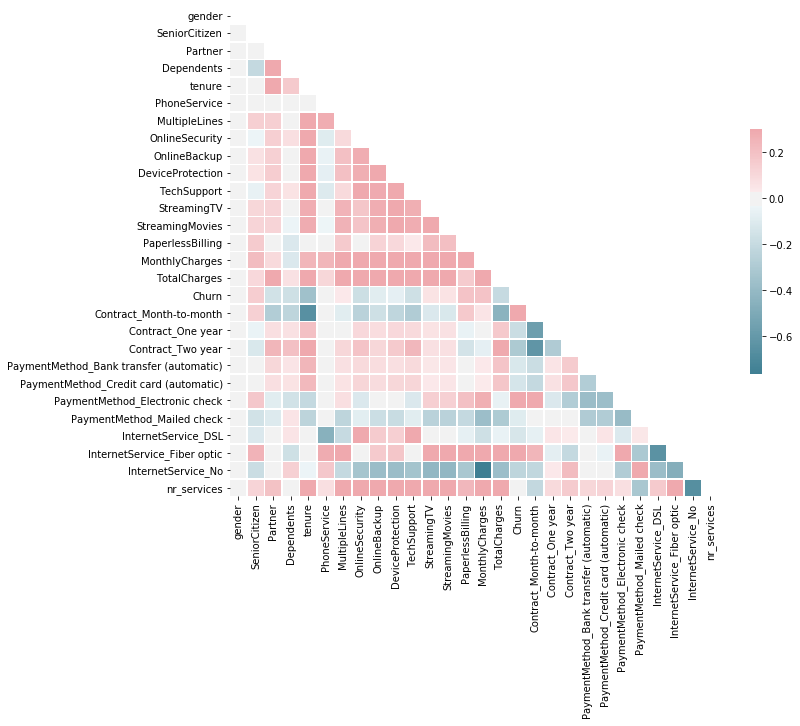

In [268]:
corr = df.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
        square=True, linewidths=.5, cbar_kws={"shrink": .5})

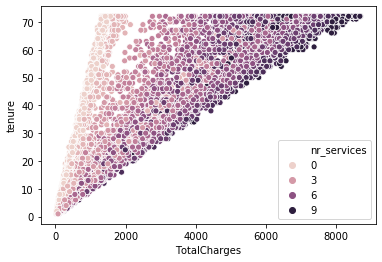

In [269]:
sns.scatterplot(df.TotalCharges, df.tenure, df.nr_services)

In [ ]:
scores = [KMeans(n_clusters=i+2).fit(df).inertia_ for i in range(10)]
sns.lineplot(np.arange(2, 12), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

In [283]:
df.drop('customerID', 1)
df= df.drop("customerID",1).head(4)

In [301]:
scores = [KMeans(n_clusters=i+2).fit(df).inertia_ for i in range(10)]

In [302]:
scores

[7924786262.497251,
 3701564276.513462,
 2116172614.7902615,
 1328991576.7012255,
 915543425.7192715,
 671604518.9386122,
 523532895.65465844,
 414512765.90127903,
 329349113.58082503,
 270424860.48354596]

In [303]:
test = [KMeans(n_clusters = i+2).fit(df).inertia_ for i in range(10)]

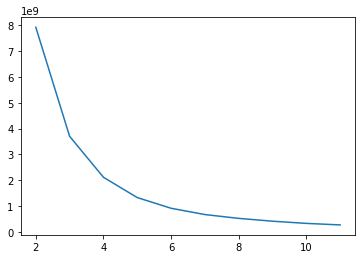

In [311]:
sns.lineplot(np.arange(2,12),scores)

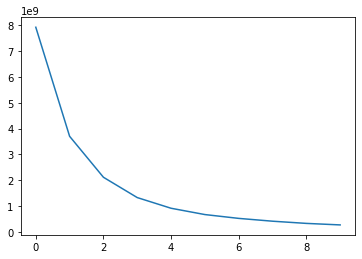

In [307]:
plt.plot(test)

In [321]:
np.unique(try_clusters)

array([0, 1, 2, 3], dtype=int32)

In [331]:
df.iloc[:,1:-1]

,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,...,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,InternetService_DSL,InternetService_Fiber optic,InternetService_No
0,0,1,0,1,0,0,0,1,0,0,...,1,0,0,0,0,1,0,1,0,0
1,0,0,0,34,1,0,1,0,1,0,...,0,1,0,0,0,0,1,1,0,0
2,0,0,0,2,1,0,1,1,0,0,...,1,0,0,0,0,0,1,1,0,0
3,0,0,0,45,0,0,1,0,1,1,...,0,1,0,1,0,0,0,1,0,0
4,0,0,0,2,1,0,0,0,0,0,...,1,0,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,1,1,24,1,1,1,0,1,1,...,0,1,0,0,0,0,1,1,0,0
7039,0,1,1,72,1,1,0,1,1,0,...,0,1,0,0,1,0,0,0,1,0
7040,0,1,1,11,0,0,1,0,0,0,...,1,0,0,0,0,1,0,1,0,0
7041,1,1,0,4,1,1,0,0,0,0,...,1,0,0,0,0,0,1,0,1,0


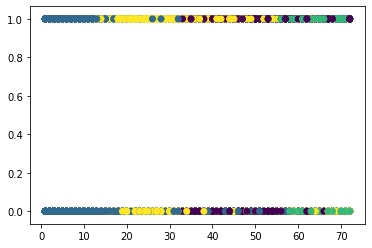

In [335]:
plt.scatter(df.tenure,df.TechSupport, c=try_clusters,
             cmap='viridis')

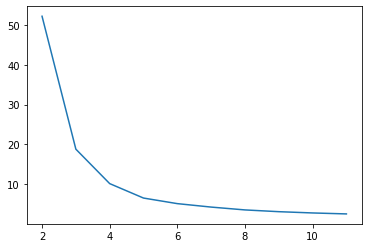

In [344]:
normalize_vectors = preprocessing.normalize(df)
scores = [KMeans(n_clusters =i+2).fit(normalize_vectors).inertia_ for i in range(10)]
sns.lineplot(np.arange(2,12),scores)

In [361]:
normalized_kmeans = KMeans(n_clusters=4)
normalized_kmeans.fit(normalize_vectors)

KMeans(n_clusters=4)

In [349]:
min_samples = df.shape[1]+1
bscab = DBSCAN(eps=3.5, min_samples=min_samples).fit(df)

In [350]:
bscab.labels_

array([-1, -1, -1, ..., -1, -1, -1])

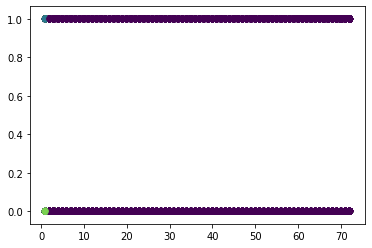

In [355]:
plt.scatter(df.tenure,df.TechSupport, c=bscab.labels_,
             cmap='viridis')

In [354]:
min_samples = df.shape[1]+1 #  Rule of thumb; number of dimensions D in the data set, as minPts ≥ D + 1
dbscan = DBSCAN(eps=3.5, min_samples=min_samples).fit_predict(df)

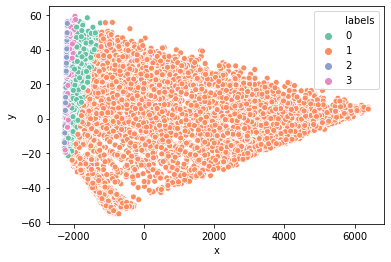

In [362]:
pca_df = prepare_pca(3, df, normalized_kmeans.labels_)
sns.scatterplot(x=pca_df.x, y=pca_df.y, hue=pca_df.labels, palette="Set2")

In [ ]:
names = ['x', 'y', 'z']
matrix = PCA(n_components=n_components).fit_transform(data)
df_matrix = pd.DataFrame(matrix)
df_matrix.rename({i:names[i] for i in range(n_components)}, axis=1, inplace=True)
df_matrix['labels'] = kmeans_labels

In [363]:
names=["x" , "y","z"]

In [371]:
n_components=3

In [365]:
matrix = PCA(n_components=3).fit_transform(df)

In [369]:
df_matrix=pd.DataFrame(matrix)
df_matrix.head(3)

,0,1,2
0,-2253.860254,-8.899666,-16.933065
1,-393.823796,-6.250363,2.599178
2,-2175.348475,11.945344,-6.359536


In [372]:
df_matrix.rename({i:names[i] for i in range(n_components)}, axis=1, inplace=True)

In [ ]:
df.matrix.remane({i:names[i] for i in range (3)}, axis=1, inplace =3)

In [373]:
df_matrix.head(3)

,x,y,z
0,-2253.860254,-8.899666,-16.933065
1,-393.823796,-6.250363,2.599178
2,-2175.348475,11.945344,-6.359536


In [375]:
df_matrix['labels'] = normalized_kmeans.labels_

In [377]:
df_matrix

,x,y,z,labels
0,-2253.860254,-8.899666,-16.933065,2
1,-393.823796,-6.250363,2.599178,1
2,-2175.348475,11.945344,-6.359536,3
3,-442.598077,-24.043570,6.603426,1
4,-2131.707895,26.817519,0.522050,3
...,...,...,...,...
7027,-292.676707,22.910829,4.827864,1
7028,5079.893457,-2.391261,-7.697471,1
7029,-1937.197601,-14.756207,-11.824638,1
7030,-1976.719136,28.689600,2.135592,0


In [383]:
df_matrix.iloc[:,0]

0      -2253.860254
1       -393.823796
2      -2175.348475
3       -442.598077
4      -2131.707895
           ...     
7027    -292.676707
7028    5079.893457
7029   -1937.197601
7030   -1976.719136
7031    4561.501163
Name: x, Length: 7032, dtype: float64

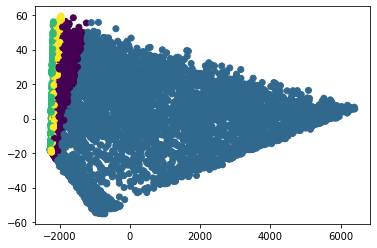

In [384]:
plt.scatter(df_matrix.iloc[:,0],df_matrix.iloc[:,1], c=df_matrix.labels)

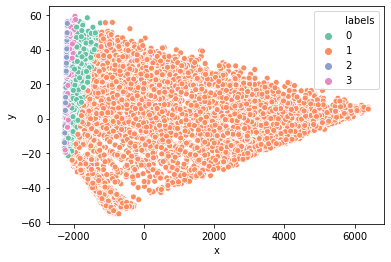

In [385]:
sns.scatterplot(x=pca_df.x, y=pca_df.y, hue=pca_df.labels, palette="Set2")

In [387]:
pca_df = prepare_pca(3, df, normalized_kmeans.labels_)
plot_3d(pca_df)

In [429]:
df_matrix.head(3)

,x,y,z,labels
0,-2253.860254,-8.899666,-16.933065,2
1,-393.823796,-6.250363,2.599178,1
2,-2175.348475,11.945344,-6.359536,3


In [389]:
plot_3d(df_matrix)

In [ ]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(df)

In [439]:
kmeans=KMeans(n_clusters=4)
kmeans.fit(df)

KMeans(n_clusters=4)

In [437]:


from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

In [440]:
tsne_3d_df = prepare_tsne(3,df,kmeans.labels_)

In [441]:
tsne_3d_df

,x,y,z,labels
0,-1.837732,3.277478,-26.315094,0
1,0.088369,-9.555639,-4.932806,2
2,-16.725039,2.186566,-10.880493,0
3,1.101123,-6.784346,-4.393160,2
4,-18.761295,3.791335,-4.396541,0
...,...,...,...,...
7027,-5.137815,-14.014345,-5.303933,2
7028,7.509823,-9.676091,4.272071,3
7029,-3.501118,19.993887,6.975126,0
7030,-10.373509,14.222848,7.091153,0


In [442]:
plot_3d(tsne_3d_df)

In [445]:
tsne_3d_df["normalized_kmeans"]=normalized_kmeans.labels_
plot_3d(tsne_3d_df, name='normalized_kmeans')

In [447]:
min_samples = df.shape[1]+1 #  Rule of thumb; number of dimensions D in the data set, as minPts ≥ D + 1
dbscan = DBSCAN(eps=3.5, min_samples=min_samples).fit(df)
# dbscan = DBSCAN(eps=50, min_samples=min_samples).fit(clustering)
tsne_3d_df['dbscan'] = [str(label) for label in dbscan.labels_]
plot_3d(tsne_3d_df, name='dbscan')

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


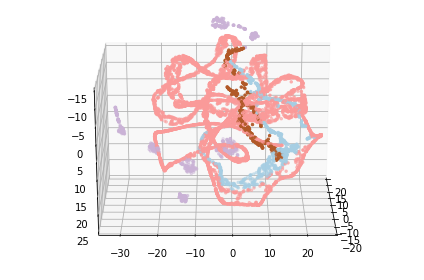

In [449]:
tsne_3d_df.dbscan = tsne_3d_df.dbscan.astype(int)
plot_animation(tsne_3d_df, 'normalized_kmeans', 'normalized_kmeans_new')

In [460]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn import preprocessing
from sklearn.metrics import silhouette_score

In [457]:
min_samples = df.shape[1]+1 #  Rule of thumb; number of dimensions D in the data set, as minPts ≥ D + 1
dbscan = DBSCAN(eps=3.5, min_samples=min_samples).fit_predict(df)

In [463]:
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df))
df_scaled.columns = df.columns
df_scaled['dbscan'] = dbscan

In [462]:
dbscan

array([-1, -1, -1, ..., -1, -1, -1])

In [465]:
df_mean = df_scaled.loc[df_scaled.dbscan!=-1, :].groupby('dbscan').mean().reset_index()

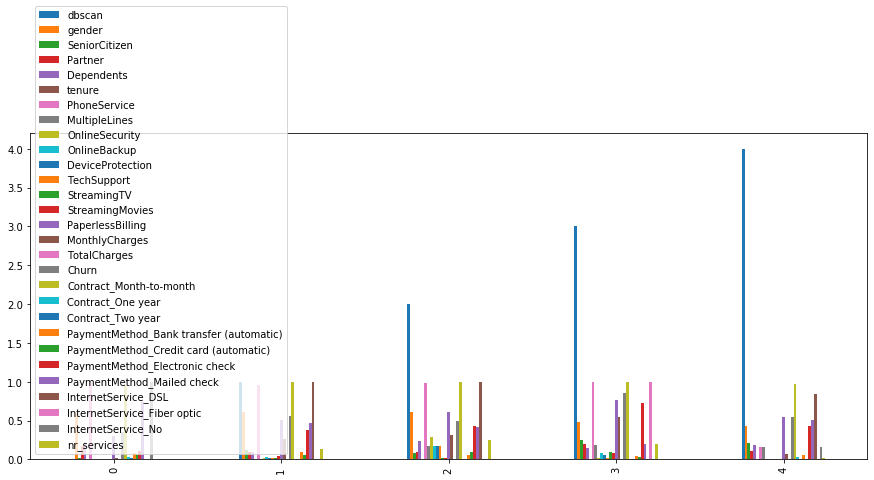

In [478]:
df_mean.plot(kind="bar",figsize=(15, 6))

In [488]:
df.shape[0]

7032

In [490]:
d=list(range(1,df_scaled.shape[0]))

In [496]:
b=[df_scaled.values]

In [500]:
min_samples = df.shape[1]+1
dbscan = DBSCAN(eps=3.5, min_samples =min_samples).fit(df)

In [ ]:
min_samples = df.shape[1]+1 #  Rule of thumb; number of dimensions D in the data set, as minPts ≥ D + 1
dbscan = DBSCAN(eps=3.5, min_samples=min_samples).fit(df)

In [525]:
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df))
df_scaled.columns = df.columns
df_scaled["dbscan"] = dbscan.labels_

In [503]:
dbscan.labels_

array([-1, -1, -1, ..., -1, -1, -1])

In [511]:
y='value'

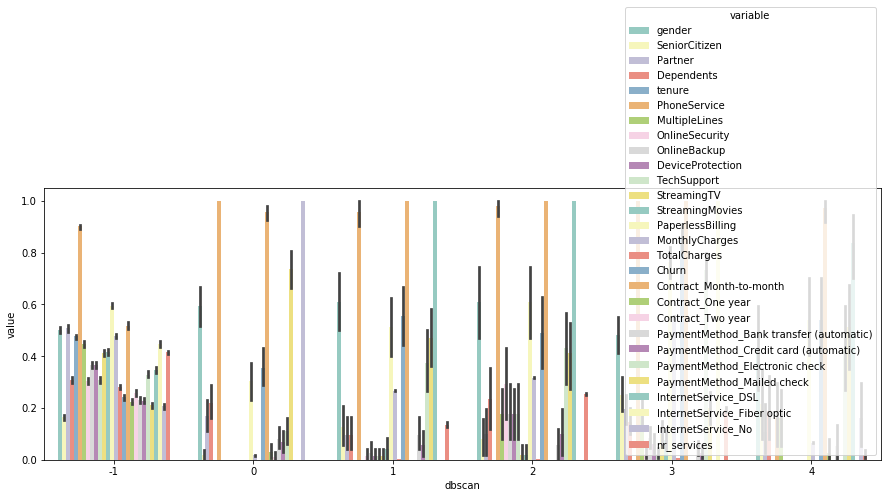

In [530]:
df["dbscan"]= dbscan.labels_
tidy = df_scaled.melt(id_vars="dbscan")
fig,ax = plt.subplots(figsize=(15,5))
sns.barplot(x='dbscan', y='value', hue='variable', data=tidy, palette='Set3')

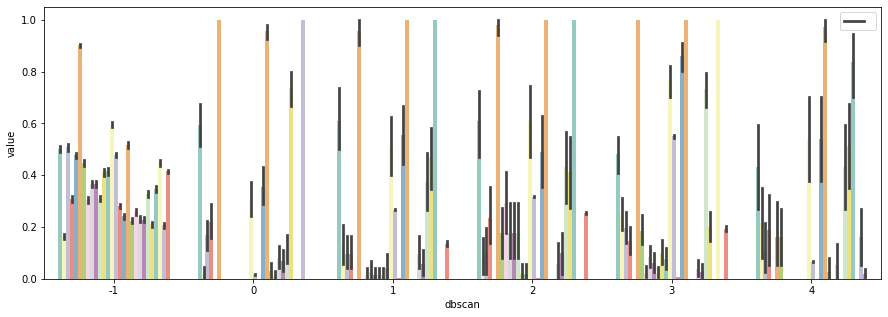

In [510]:
df['dbscan'] = dbscan.labels_
tidy = df_scaled.melt(id_vars='dbscan')
fig, ax = plt.subplots(figsize=(15, 5))
sns.barplot(x='dbscan', y='value', hue='variable', data=tidy, palette='Set3')
plt.legend([''])
# plt.savefig("mess.jpg", dpi=300)
plt.savefig("dbscan_mess.jpg", dpi=300)

In [534]:
df_scaled.dbscan.value_counts()

-1    6533
 3     179
 0     160
 1      72
 2      51
 4      37
Name: dbscan, dtype: int64

In [539]:
df_mean =df_scaled.loc[df_scaled.dbscan!=1,:].groupby("dbscan").mean().reset_index()

In [540]:
df_mean

,dbscan,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,...,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,InternetService_DSL,InternetService_Fiber optic,InternetService_No,nr_services
0,-1,0.501607,0.164243,0.507424,0.307975,0.476364,0.901270,0.446809,0.305373,0.367213,...,0.224399,0.257615,0.231134,0.228991,0.329251,0.210623,0.346242,0.446502,0.207255,0.414549
1,0,0.593750,0.018750,0.168750,0.218750,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.031250,0.012500,0.081250,0.068750,0.112500,0.737500,0.000000,0.000000,1.000000,0.000000
2,2,0.607843,0.078431,0.098039,0.235294,0.000000,0.980392,0.176471,0.294118,0.176471,...,0.000000,0.000000,0.058824,0.098039,0.431373,0.411765,1.000000,0.000000,0.000000,0.252451
3,3,0.480447,0.251397,0.195531,0.145251,0.000000,1.000000,0.184358,0.022346,0.083799,...,0.000000,0.000000,0.039106,0.027933,0.731844,0.201117,0.000000,1.000000,0.000000,0.194134
4,4,0.432432,0.216216,0.108108,0.189189,0.000000,0.162162,0.162162,0.000000,0.000000,...,0.027027,0.000000,0.054054,0.000000,0.432432,0.513514,0.837838,0.000000,0.162162,0.020270


In [576]:
results = pd.DataFrame(columns=['Variable', 'Std'])

In [544]:
df_mean.columns[1:]

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'OnlineSecurity', 'OnlineBackup',
       'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
       'PaperlessBilling', 'MonthlyCharges', 'TotalCharges', 'Churn',
       'Contract_Month-to-month', 'Contract_One year', 'Contract_Two year',
       'PaymentMethod_Bank transfer (automatic)',
       'PaymentMethod_Credit card (automatic)',
       'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check',
       'InternetService_DSL', 'InternetService_Fiber optic',
       'InternetService_No', 'nr_services'],
      dtype='object')

In [566]:
for column in df_mean.columns[1:]:
    results.loc[len(results),:]= [column,np.std(df_mean[column])]

selected_columns = list(results.sort_values('Std', ascending=False).head(7).Variable.values) + ['dbscan']
selected_columns

['InternetService_DSL',
 'InternetService_DSL',
 'InternetService_DSL',
 'InternetService_DSL',
 'InternetService_DSL',
 'InternetService_DSL',
 'InternetService_DSL',
 'dbscan']

In [577]:
for column in df_mean.columns[1:]:
    results.loc[len(results), :] = [column, np.std(df_mean[column])] 
    # fills in results with row std len(results is that row)
selected_columns = list(results.sort_values('Std', ascending=False).head(7).Variable.values) + ['dbscan']  
#gets top sorted variable names

In [578]:
tidy  = df_scaled[selected_columns].melt(id_vars ="dbscan")

In [579]:
tidy

,dbscan,variable,value
0,-1,InternetService_DSL,1.0
1,-1,InternetService_DSL,1.0
2,-1,InternetService_DSL,1.0
3,-1,InternetService_DSL,1.0
4,-1,InternetService_DSL,0.0
...,...,...,...
49219,-1,PaymentMethod_Mailed check,1.0
49220,-1,PaymentMethod_Mailed check,0.0
49221,-1,PaymentMethod_Mailed check,0.0
49222,-1,PaymentMethod_Mailed check,1.0


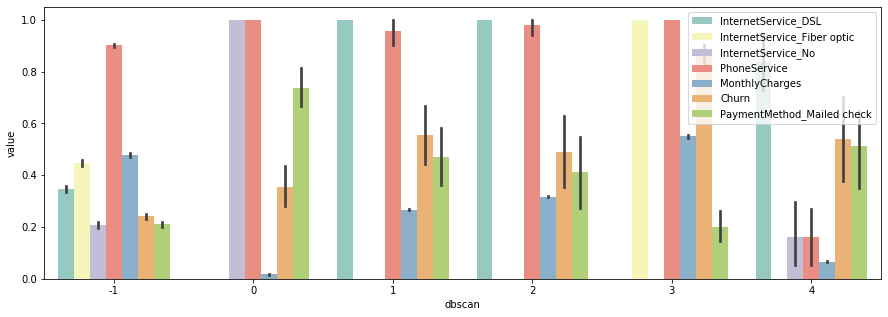

In [582]:
fig, ax = plt.subplots(figsize=(15, 5))
sns.barplot(x='dbscan', y='value', hue='variable', data=tidy, palette='Set3' )
plt.legend(loc='upper right')

In [587]:
from sklearn.ensemble import RandomForestClassifier
slf = RandomForestClassifier(n_estimators = 100)

In [589]:
y=df.iloc[:,-1]

In [590]:
X = df.iloc[:,:-1]

In [591]:
slf.fit(X,y)

RandomForestClassifier()

In [615]:
k=pd.concat([pd.Series(slf.feature_importances_), pd.Series(X.columns)],axis=1)

In [612]:
k

,0,1
0,0.002153,gender
1,0.001514,SeniorCitizen
2,0.004521,Partner
3,0.001838,Dependents
4,0.282593,tenure
5,0.015808,PhoneService
6,0.006450,MultipleLines
7,0.002818,OnlineSecurity
8,0.004250,OnlineBackup
9,0.002450,DeviceProtection


In [610]:
pd.DataFrame(k, columns=['Importance', 'Feature'])

,Importance,Feature
0,NaN,NaN
1,NaN,NaN
2,NaN,NaN
3,NaN,NaN
4,NaN,NaN
5,NaN,NaN
6,NaN,NaN
7,NaN,NaN
8,NaN,NaN
9,NaN,NaN


In [616]:
from sklearn.ensemble import RandomForestClassifier
y = df.iloc[:,-1]
X = df.iloc[:,:-1]
clf = RandomForestClassifier(n_estimators=100).fit(X, y)
selected_columns = list(pd.DataFrame(np.array([clf.feature_importances_, X.columns]).T, columns=['Importance', 'Feature'])
           .sort_values("Importance", ascending=False)
           .head(7)
           .Feature
           .values)

In [618]:
selected_columns 

['TotalCharges',
 'tenure',
 'MonthlyCharges',
 'nr_services',
 'InternetService_Fiber optic',
 'InternetService_No',
 'InternetService_DSL']

In [619]:
results

,Variable,Std
0,gender,0.0673418
1,SeniorCitizen,0.0861736
2,Partner,0.150422
3,Dependents,0.0538687
4,tenure,0.190546
5,PhoneService,0.325346
6,MultipleLines,0.143501
7,OnlineSecurity,0.143472
8,OnlineBackup,0.137304
9,DeviceProtection,0.138834


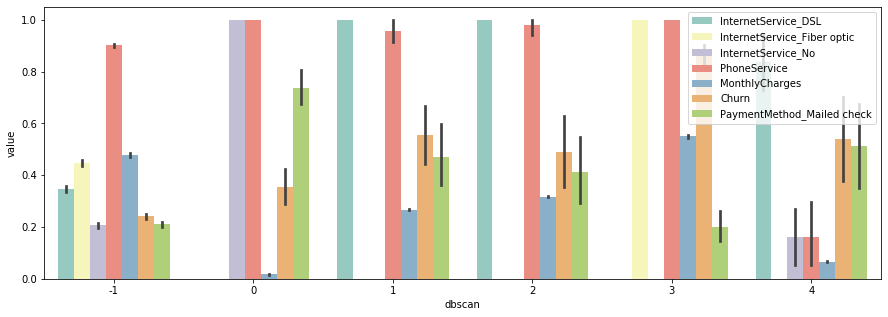

In [575]:
results = pd.DataFrame(columns=['Variable', 'Std'])
for column in df_mean.columns[1:]:
    results.loc[len(results), :] = [column, np.std(df_mean[column])]
selected_columns = list(results.sort_values('Std', ascending=False).head(7).Variable.values) + ['dbscan']

# Plot data
tidy = df_scaled[selected_columns].melt(id_vars='dbscan')
fig, ax = plt.subplots(figsize=(15, 5))
sns.barplot(x='dbscan', y='value', hue='variable', data=tidy, palette='Set3')
plt.legend(loc='upper right')
plt.savefig("dbscan_results.jpg", dpi=300)

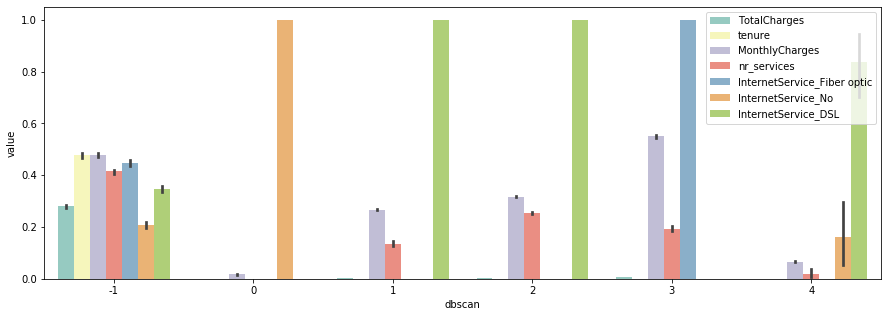

In [620]:
tidy = df_scaled[selected_columns+['dbscan']].melt(id_vars='dbscan')
fig, ax = plt.subplots(figsize=(15, 5))
sns.barplot(x='dbscan', y='value', hue='variable', data=tidy, palette='Set3')
plt.legend(loc='upper right')
plt.savefig('randomforest.jpg', dpi=300)

In [434]:
a= [1,2,3,4,5,6,7,8,9] 
b=[21,22,23,24,52,62,72,82,92]
index=list(range(1,10))
index2=[1,2,3,1,1,1,1,1,1] 
c=pd.DataFrame(pd.concat([pd.Series(a),pd.Series(b),pd.Series(index),pd.Series(index2)],axis=1))
c=c.rename(columns={0: "x", 1: "y", 2:"z",3:"labels"})
c

,x,y,z,labels
0,1,21,1,1
1,2,22,2,2
2,3,23,3,3
3,4,24,4,1
4,5,52,5,1
5,6,62,6,1
6,7,72,7,1
7,8,82,8,1
8,9,92,9,1


In [435]:
plot_3d(c)

In [386]:
try_clusters = KMeans(n_clusters=4).fit_predict(df)
plt.scatter(df[:,1],df[:,2],c=try_clusters)

TypeError: '(slice(None, None, None), 1)' is an invalid key

In [218]:
re_eng_col_data=[ 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
                    'TechSupport','StreamingTV', 'StreamingMovies', 'Partner', 'Dependents',
                   'PhoneService', 'MultipleLines', 'PaperlessBilling', 'Churn']

In [219]:
df.gender = df.gender.replace({"Female":0, "Male":1})

In [220]:
for i in re_eng_col_data:
    df.loc[:,i] =df.loc[:,i].replace({'No internet service' : 'No', 'No phone service':'No'})
    df.loc[:,i]= df.loc[:,i].map({"No":0,"Yes":1})
    #df.gender = df.gender.map({"Female":0, "Male":1})
    

In [221]:
others_categorical = ['Contract', 'PaymentMethod', 'InternetService']

In [225]:
others_categorical = ['Contract', 'PaymentMethod', 'InternetService']
for i in others_categorical:
    df = df.join(pd.get_dummies(df[i], prefix=i))
    df.drop(others_categorical, axis=1, inplace=True)
    

KeyError: 'PaymentMethod'

In [169]:
df.head(4)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,0,0,1,0,1,0,0,DSL,0,...,0,0,0,0,Month-to-month,1,Electronic check,29.85,29.85,0
1,5575-GNVDE,1,0,0,0,34,1,0,DSL,1,...,1,0,0,0,One year,0,Mailed check,56.95,1889.5,0
2,3668-QPYBK,1,0,0,0,2,1,0,DSL,1,...,0,0,0,0,Month-to-month,1,Mailed check,53.85,108.15,1
3,7795-CFOCW,1,0,0,0,45,0,0,DSL,1,...,1,1,0,0,One year,0,Bank transfer (automatic),42.30,1840.75,0


In [101]:
df["MultipleLines"]=df["MultipleLines"].astype(str)

In [106]:
df["MultipleLines"].replace({"dfg":"qweqw", "Yes":"dfg"})

0        No
1        No
2        No
3        No
4        No
       ... 
7038    dfg
7039    dfg
7040     No
7041    dfg
7042     No
Name: MultipleLines, Length: 7032, dtype: object

In [52]:
df = df.loc[df.TotalCharges!=" ", :]
df.shape

(7032, 21)

In [76]:
df.TotalCharges = df.TotalCharges.astype(float)

In [77]:
df.TotalCharges.head(3)

0      29.85
1    1889.50
2     108.15
Name: TotalCharges, dtype: float64

In [78]:
df.TotalCharges.dtype

dtype('float64')

In [62]:
df.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No


In [39]:
df[df["TotalCharges"]==" "].count()

customerID          11
gender              11
SeniorCitizen       11
Partner             11
Dependents          11
tenure              11
PhoneService        11
MultipleLines       11
InternetService     11
OnlineSecurity      11
OnlineBackup        11
DeviceProtection    11
TechSupport         11
StreamingTV         11
StreamingMovies     11
Contract            11
PaperlessBilling    11
PaymentMethod       11
MonthlyCharges      11
TotalCharges        11
Churn               11
dtype: int64

In [43]:
df.isna().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64